In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import time

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
from torchvision import datasets, models, transforms

os.environ["PYTHONWARNINGS"] = "ignore::UserWarning"

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # device object

transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(), # data augmentation
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalization
])

transforms_val = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()


data_dir = './simple_dog_and_cat_dataset'
train_datasets = datasets.ImageFolder(os.path.join(data_dir, 'train'), transforms_train)
val_datasets = datasets.ImageFolder(os.path.join(data_dir, 'val'), transforms_val)
test_datasets = datasets.ImageFolder(os.path.join(data_dir, 'test'), transforms_test)

train_dataloader = torch.utils.data.DataLoader(train_datasets, batch_size=16, shuffle=True, num_workers=4)
val_dataloader = torch.utils.data.DataLoader(val_datasets, batch_size=16, shuffle=False, num_workers=4)
test_dataloader = torch.utils.data.DataLoader(test_datasets, batch_size=16, shuffle=True, num_workers=4)
class_names = train_datasets.classes

d:\Python\Python38\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
d:\Python\Python38\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: Could not find module 'D:\Python\Python38\Lib\site-packages\torchvision\image.pyd' (or one of its dependencies). Try using the full path with constructor syntax.
  warn(f"Failed to load image Python extension: {e}")


迁移学习

Feature loss: 5.093847274780273, Image loss: 3.8999416535771597e-16, Time: 0.019932985305786133
Feature loss: 0.2859886586666107, Image loss: 0.010820576921105385, Time: 10.388553142547607
Feature loss: 0.21291393041610718, Image loss: 0.01626182347536087, Time: 21.48363947868347


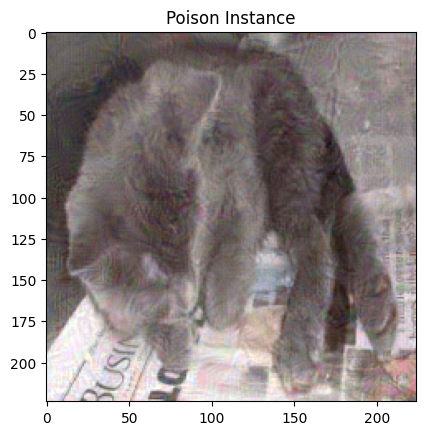

[Train #0] Loss: 5.2372 Acc: 86.6000% Time: 8.5124s
[Validation #0] Loss: 8.4160 Acc: 85.0000% Time: 11.5653s


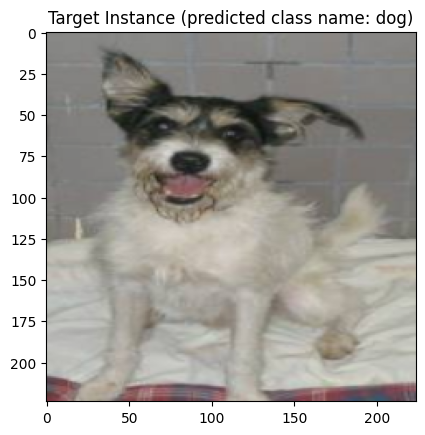

[Predicted Confidence] cat: 7.097029310898506e-07 | dog: 0.9999992847442627
poison attack success rate:18.0%
[Train #1] Loss: 2.0075 Acc: 94.2000% Time: 21.2903s
[Validation #1] Loss: 4.8437 Acc: 89.0000% Time: 24.4073s
[Train #2] Loss: 1.2046 Acc: 96.3000% Time: 33.1208s
[Validation #2] Loss: 5.1696 Acc: 91.5000% Time: 36.1649s
[Train #3] Loss: 0.7101 Acc: 98.4000% Time: 45.1396s
[Validation #3] Loss: 6.2216 Acc: 89.0000% Time: 48.3669s
[Train #4] Loss: 0.6184 Acc: 97.9000% Time: 57.2812s
[Validation #4] Loss: 6.5447 Acc: 90.5000% Time: 60.4796s
[Train #5] Loss: 1.3807 Acc: 96.7000% Time: 69.3653s
[Validation #5] Loss: 6.4681 Acc: 91.5000% Time: 72.5762s


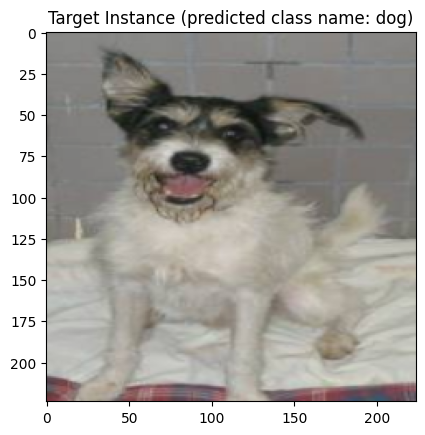

[Predicted Confidence] cat: 0.0010875677689909935 | dog: 0.9989124536514282
poison attack success rate:6.0%
[Train #6] Loss: 0.8390 Acc: 97.6000% Time: 82.6177s
[Validation #6] Loss: 6.7722 Acc: 92.5000% Time: 85.7373s
[Train #7] Loss: 0.6299 Acc: 98.3000% Time: 94.5900s
[Validation #7] Loss: 6.9362 Acc: 91.5000% Time: 97.7261s
[Train #8] Loss: 0.2494 Acc: 99.2000% Time: 106.5218s
[Validation #8] Loss: 8.2778 Acc: 90.5000% Time: 109.6369s
[Train #9] Loss: 0.2491 Acc: 99.2000% Time: 118.4397s
[Validation #9] Loss: 7.8689 Acc: 91.0000% Time: 121.6594s
[Train #10] Loss: 0.1116 Acc: 99.6000% Time: 130.5470s
[Validation #10] Loss: 6.8910 Acc: 91.5000% Time: 133.7896s


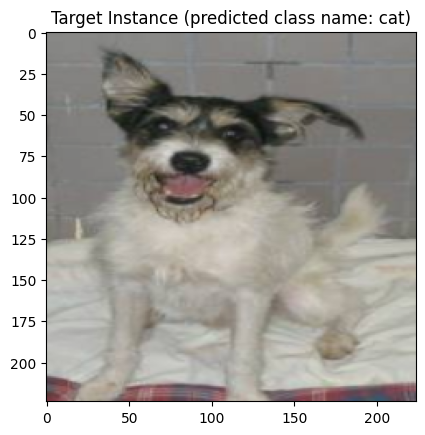

[Predicted Confidence] cat: 1.0 | dog: 0.0
poison attack success rate:9.0%
[Train #11] Loss: 0.0769 Acc: 99.5000% Time: 143.8628s
[Validation #11] Loss: 7.0295 Acc: 94.0000% Time: 147.0042s
[Train #12] Loss: 0.1063 Acc: 99.5000% Time: 156.4616s
[Validation #12] Loss: 6.6483 Acc: 93.0000% Time: 159.9100s
[Train #13] Loss: 0.0935 Acc: 99.4000% Time: 168.9823s
[Validation #13] Loss: 6.7321 Acc: 92.5000% Time: 172.3044s
[Train #14] Loss: 0.0679 Acc: 99.3000% Time: 181.1160s
[Validation #14] Loss: 7.0244 Acc: 94.0000% Time: 184.3652s
[Train #15] Loss: 0.3640 Acc: 98.9000% Time: 193.5365s
[Validation #15] Loss: 7.8959 Acc: 92.5000% Time: 196.8595s


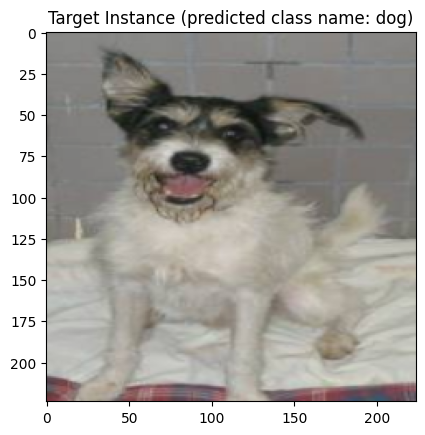

[Predicted Confidence] cat: 3.339589788572504e-24 | dog: 1.0
poison attack success rate:4.0%
[Train #16] Loss: 0.3044 Acc: 99.2000% Time: 207.0864s
[Validation #16] Loss: 6.6053 Acc: 93.5000% Time: 210.3072s
[Train #17] Loss: 0.1745 Acc: 99.5000% Time: 219.2688s
[Validation #17] Loss: 7.7245 Acc: 93.5000% Time: 222.4896s
[Train #18] Loss: 0.3420 Acc: 98.6000% Time: 231.3727s
[Validation #18] Loss: 7.9715 Acc: 92.5000% Time: 234.6434s
[Train #19] Loss: 0.5195 Acc: 98.9000% Time: 243.6285s
[Validation #19] Loss: 9.1208 Acc: 92.0000% Time: 246.8285s
[Train #20] Loss: 0.1763 Acc: 99.7000% Time: 256.0033s
[Validation #20] Loss: 9.5856 Acc: 91.5000% Time: 259.2931s


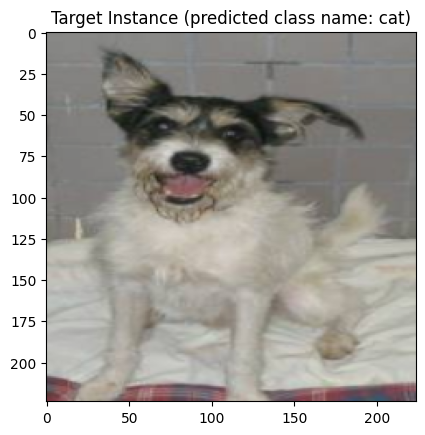

[Predicted Confidence] cat: 1.0 | dog: 1.401298464324817e-45
poison attack success rate:7.0%
[Train #21] Loss: 0.2158 Acc: 99.5000% Time: 269.7533s
[Validation #21] Loss: 11.7234 Acc: 91.0000% Time: 273.0143s
[Train #22] Loss: 0.2709 Acc: 99.5000% Time: 281.9804s
[Validation #22] Loss: 10.0167 Acc: 92.0000% Time: 285.2984s
[Train #23] Loss: 0.1208 Acc: 99.4000% Time: 294.3294s
[Validation #23] Loss: 11.7369 Acc: 91.0000% Time: 297.5750s
[Train #24] Loss: 0.0695 Acc: 99.7000% Time: 306.5566s
[Validation #24] Loss: 11.5244 Acc: 91.0000% Time: 309.8378s
[Train #25] Loss: 0.1834 Acc: 99.6000% Time: 319.0123s
[Validation #25] Loss: 12.3265 Acc: 91.0000% Time: 322.2876s


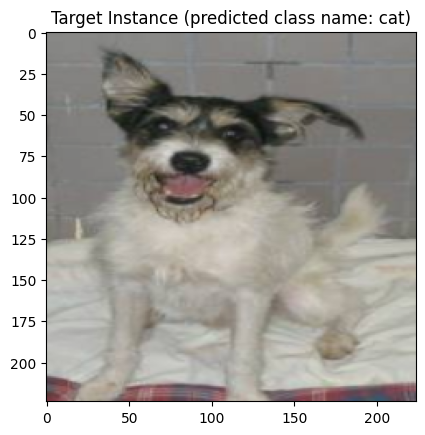

[Predicted Confidence] cat: 1.0 | dog: 0.0
poison attack success rate:9.0%
[Train #26] Loss: 0.1545 Acc: 99.5000% Time: 332.8023s
[Validation #26] Loss: 10.7901 Acc: 94.5000% Time: 336.0329s
[Train #27] Loss: 0.1802 Acc: 99.5000% Time: 345.0700s
[Validation #27] Loss: 11.4581 Acc: 93.0000% Time: 348.2217s
[Train #28] Loss: 0.4285 Acc: 99.1000% Time: 357.2047s
[Validation #28] Loss: 11.1375 Acc: 93.5000% Time: 360.4364s
[Train #29] Loss: 0.3016 Acc: 99.6000% Time: 369.4328s
[Validation #29] Loss: 11.1151 Acc: 93.0000% Time: 372.8204s
[Train #30] Loss: 0.1355 Acc: 99.8000% Time: 382.0068s
[Validation #30] Loss: 11.5992 Acc: 90.5000% Time: 385.3333s


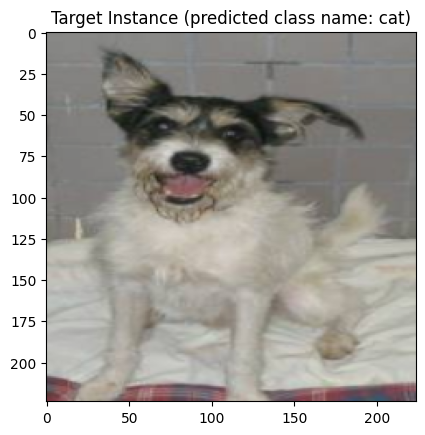

[Predicted Confidence] cat: 1.0 | dog: 0.0
poison attack success rate:11.0%
[Train #31] Loss: 0.6863 Acc: 99.0000% Time: 395.7116s
[Validation #31] Loss: 16.5856 Acc: 88.5000% Time: 399.2163s
[Train #32] Loss: 0.1409 Acc: 99.5000% Time: 408.4460s
[Validation #32] Loss: 13.0451 Acc: 92.0000% Time: 411.7813s
[Train #33] Loss: 0.1647 Acc: 99.9000% Time: 420.7802s
[Validation #33] Loss: 12.6674 Acc: 92.5000% Time: 424.0596s
[Train #34] Loss: 0.0258 Acc: 99.9000% Time: 433.2006s
[Validation #34] Loss: 15.0500 Acc: 90.0000% Time: 436.4570s
[Train #35] Loss: 0.5499 Acc: 99.2000% Time: 445.4030s
[Validation #35] Loss: 14.3015 Acc: 90.0000% Time: 448.6040s


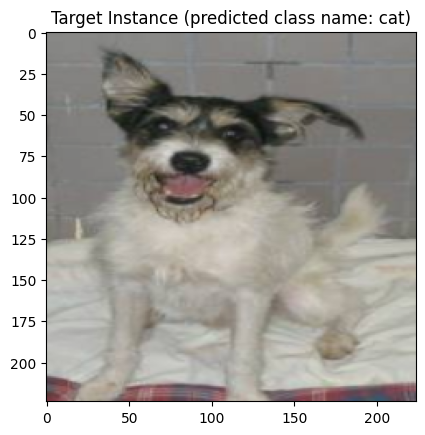

[Predicted Confidence] cat: 1.0 | dog: 3.877751134778127e-37
poison attack success rate:4.0%
[Train #36] Loss: 0.0973 Acc: 99.7000% Time: 458.6838s
[Validation #36] Loss: 14.1896 Acc: 92.0000% Time: 462.0242s
[Train #37] Loss: 0.1917 Acc: 99.6000% Time: 471.2125s
[Validation #37] Loss: 18.0782 Acc: 89.0000% Time: 474.4260s
[Train #38] Loss: 0.1481 Acc: 99.7000% Time: 483.3978s
[Validation #38] Loss: 11.8371 Acc: 92.5000% Time: 486.6816s
[Train #39] Loss: 0.2798 Acc: 99.4000% Time: 495.4319s
[Validation #39] Loss: 18.9747 Acc: 90.0000% Time: 498.6171s
[Train #40] Loss: 0.3283 Acc: 99.4000% Time: 507.4928s
[Validation #40] Loss: 11.3502 Acc: 92.5000% Time: 510.6526s


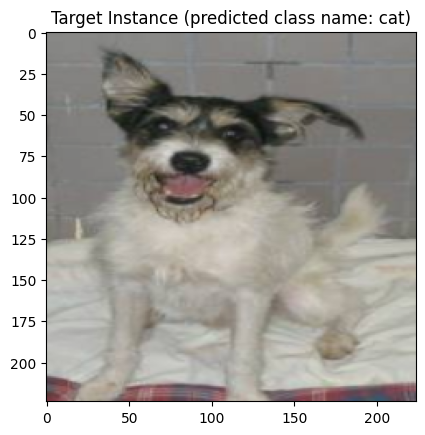

[Predicted Confidence] cat: 1.0 | dog: 0.0
poison attack success rate:8.0%
[Train #41] Loss: 0.4702 Acc: 99.6000% Time: 520.8780s
[Validation #41] Loss: 15.1831 Acc: 91.5000% Time: 524.0504s
[Train #42] Loss: 1.7472 Acc: 98.1000% Time: 533.1606s
[Validation #42] Loss: 21.6914 Acc: 90.0000% Time: 536.4109s
[Train #43] Loss: 0.5243 Acc: 99.7000% Time: 545.3881s
[Validation #43] Loss: 17.5543 Acc: 93.0000% Time: 548.6922s
[Train #44] Loss: 0.4779 Acc: 99.5000% Time: 558.0007s
[Validation #44] Loss: 17.1265 Acc: 92.5000% Time: 561.1974s
[Train #45] Loss: 0.0920 Acc: 99.9000% Time: 570.4946s
[Validation #45] Loss: 17.5161 Acc: 93.0000% Time: 573.8529s


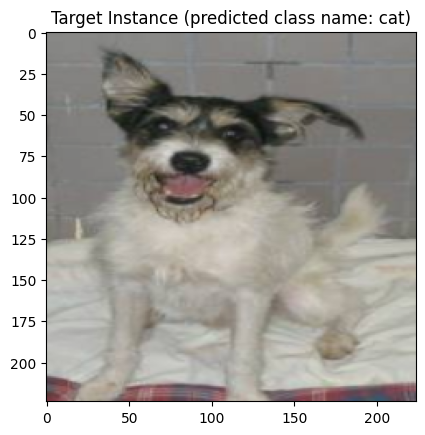

[Predicted Confidence] cat: 1.0 | dog: 0.0
poison attack success rate:6.0%
[Train #46] Loss: 0.0133 Acc: 99.9000% Time: 584.0668s
[Validation #46] Loss: 21.5659 Acc: 90.5000% Time: 587.2202s
[Train #47] Loss: 0.0205 Acc: 99.9000% Time: 596.7355s
[Validation #47] Loss: 17.6376 Acc: 93.5000% Time: 599.9278s
[Train #48] Loss: 0.0000 Acc: 100.0000% Time: 609.0373s
[Validation #48] Loss: 17.6774 Acc: 92.5000% Time: 612.3151s
[Train #49] Loss: 0.0000 Acc: 100.0000% Time: 621.2870s
[Validation #49] Loss: 17.6760 Acc: 92.5000% Time: 624.5520s


In [21]:
class StudentNetwork(nn.Module):
    def __init__(self):
        super(StudentNetwork, self).__init__()

        # load a pre-trained model for the feature extractor
        self.feature_extractor = nn.Sequential(*list(models.alexnet(weights=models.AlexNet_Weights.DEFAULT).children())[:-1]).eval()
        self.fc = nn.Linear(9216, 2) # binary classification (num_of_class == 2)

        # fix the pre-trained network
        for param in self.feature_extractor.parameters():
            param.requires_grad = False

    def forward(self, images):
        features = self.feature_extractor(images)
        x = torch.flatten(features, 1)
        outputs = self.fc(x)
        return features, outputs

model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.01)

def GenPoiImg(base_instance):
    mean_tensor = torch.from_numpy(np.array([0.485, 0.456, 0.406]))
    std_tensor = torch.from_numpy(np.array([0.229, 0.224, 0.225]))

    unnormalized_base_instance = base_instance.clone()
    unnormalized_base_instance[:, 0, :, :] *= std_tensor[0]
    unnormalized_base_instance[:, 0, :, :] += mean_tensor[0]
    unnormalized_base_instance[:, 1, :, :] *= std_tensor[1]
    unnormalized_base_instance[:, 1, :, :] += mean_tensor[1]
    unnormalized_base_instance[:, 2, :, :] *= std_tensor[2]
    unnormalized_base_instance[:, 2, :, :] += mean_tensor[2]

    perturbed_instance = unnormalized_base_instance.clone()
    target_features, outputs = model(target_instance)

    transforms_normalization = transforms.Compose([
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    epsilon = 16 / 255
    alpha = 0.05 / 255

    start_time = time.time()
    # 尝试改一下这里的迭代次数
    for i in range(1000):
        perturbed_instance.requires_grad = True

        poison_instance = transforms_normalization(perturbed_instance)
        poison_features, _ = model(poison_instance)
        # 补充代码

        feature_loss = nn.MSELoss()(poison_features, target_features)
        image_loss = nn.MSELoss()(poison_instance, base_instance)
        loss = feature_loss + image_loss / 1e2
        loss.backward()

        signed_gradient = perturbed_instance.grad.sign()

        perturbed_instance = perturbed_instance - alpha * signed_gradient

        eta = torch.clamp(perturbed_instance - unnormalized_base_instance, -epsilon, epsilon)
        perturbed_instance = torch.clamp(unnormalized_base_instance + eta, 0, 1).detach()

        if i == 0 or (i + 1) % 500 == 0:
            print(f'Feature loss: {feature_loss}, Image loss: {image_loss}, Time: {time.time() - start_time}')

    poison_instance = transforms_normalization(perturbed_instance)
    imshow(poison_instance[0].cpu(), 'Poison Instance')
    return poison_instance


if __name__ == '__main__':
    base_instance_sum = []
    target_instance_sum = []
    for inputs, labels in test_dataloader:
        for i in range(inputs.shape[0]):
            if labels[i].item() == 0: # if it's a cat
                base_instance_sum.append(inputs[i].unsqueeze(0).to(device))
            elif labels[i].item() == 1: # if it's a dog
                target_instance_sum.append(inputs[i].unsqueeze(0).to(device))
    base_instance = base_instance_sum[0]
    target_instance = target_instance_sum[0]
    poison_instance = GenPoiImg(base_instance)

    num_epochs = 50
    start_time = time.time()

    for epoch in range(num_epochs):
        """ Training Phase """
        running_loss = 0.
        running_corrects = 0

        # load a batch data of images
        for i, (inputs, labels) in enumerate(train_dataloader):

            # for the first batch
            if i == 0:
                # change the first data to poison image
                inputs[0] = poison_instance[0]
                labels[0] = torch.tensor(0)

            inputs = inputs.to(device)
            labels = labels.to(device)

            # forward inputs and get output
            optimizer.zero_grad()

            features, outputs = model(inputs)

            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # get loss value and update the network weights
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_datasets)
        epoch_acc = running_corrects / len(train_datasets) * 100.
        print('[Train #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc,
                                                                           time.time() - start_time))

        """ Validation Phase """
        with torch.no_grad():
            running_loss = 0.
            running_corrects = 0

            for inputs, labels in val_dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                features, outputs = model(inputs)

                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(val_datasets)
            epoch_acc = running_corrects / len(val_datasets) * 100.
            print('[Validation #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc,
                                                                                    time.time() - start_time))

        if (epoch == 0) or epoch % 5 == 0:
            """ Poisoning Attack Test Phase """
            with torch.no_grad():
                _, outputs = model(target_instance)
                _, preds = torch.max(outputs, 1)

                imshow(target_instance[0].cpu(), f'Target Instance (predicted class name: {class_names[preds.item()]})')
                percentages = nn.Softmax(dim=1)(outputs)[0]
                print(f'[Predicted Confidence] {class_names[0]}: {percentages[0]} | {class_names[1]}: {percentages[1]}')
                
                running_corrects = 0
                for inputs in target_instance_sum:
                    inputs = inputs.to(device)

                    features, outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)

                    running_corrects += torch.sum(preds == 0)
                epoch_acc = running_corrects / len(target_instance_sum) * 100.
                print(f'poison attack success rate:{epoch_acc}%')

端到端训练(仅一张目标样本，毒样本多样化)

In [21]:
gama = 0.2
poi_rate = 0.001
model_acces = []
poison_acces = []

class StudentNetwork(nn.Module):
    def __init__(self):
        super(StudentNetwork, self).__init__()

        # load a pre-trained model for the feature extractor
        self.feature_extractor = nn.Sequential(*list(models.alexnet(weights=models.AlexNet_Weights.DEFAULT).children())[:-1]).eval()
        self.fc = nn.Linear(9216, 2) # binary classification (num_of_class == 2)

        # fix the pre-trained network
        # for param in self.feature_extractor.parameters():
        #     param.requires_grad = False

    def forward(self, images):
        features = self.feature_extractor(images)
        x = torch.flatten(features, 1)
        outputs = self.fc(x)
        return features, outputs

def GenPoiImg(base_instance,target_instance):
    base_instance = gama*target_instance + (1 - gama)*base_instance
    mean_tensor = torch.from_numpy(np.array([0.485, 0.456, 0.406]))
    std_tensor = torch.from_numpy(np.array([0.229, 0.224, 0.225]))

    unnormalized_base_instance = base_instance.clone()
    unnormalized_base_instance[:, 0, :, :] *= std_tensor[0]
    unnormalized_base_instance[:, 0, :, :] += mean_tensor[0]
    unnormalized_base_instance[:, 1, :, :] *= std_tensor[1]
    unnormalized_base_instance[:, 1, :, :] += mean_tensor[1]
    unnormalized_base_instance[:, 2, :, :] *= std_tensor[2]
    unnormalized_base_instance[:, 2, :, :] += mean_tensor[2]

    perturbed_instance = unnormalized_base_instance.clone()
    target_features, outputs = model(target_instance)

    transforms_normalization = transforms.Compose([
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    epsilon = 16 / 255
    alpha = 0.05 / 255

    start_time = time.time()
    # 尝试改一下这里的迭代次数
    for i in range(500):
        perturbed_instance.requires_grad = True

        poison_instance = transforms_normalization(perturbed_instance)
        poison_features, _ = model(poison_instance)
        # 补充代码

        feature_loss = nn.MSELoss()(poison_features, target_features)
        image_loss = nn.MSELoss()(poison_instance, base_instance)
        # feature_loss = torch.dist(target_features, poison_features, p=2) ** 2
        # image_loss = torch.dist(base_instance, poison_instance, p=2) ** 2
        loss = feature_loss + image_loss / 1e2
        loss.backward(retain_graph=True)

        signed_gradient = perturbed_instance.grad.sign()

        perturbed_instance = perturbed_instance - alpha * signed_gradient

        eta = torch.clamp(perturbed_instance - unnormalized_base_instance, -epsilon, epsilon)
        perturbed_instance = torch.clamp(unnormalized_base_instance + eta, 0, 1).detach()

        # if i == 0 or (i + 1) % 500 == 0:
        #     print(f'Feature loss: {feature_loss}, Image loss: {image_loss}, Time: {time.time() - start_time}')

    poison_instance = transforms_normalization(perturbed_instance)
    # imshow(poison_instance[0].cpu(), 'Poison Instance')
    return poison_instance

model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc

def train():
    
    macc = 0
    pacc = 0
    base_instance_sum = []
    target_instance_sum = []
    for inputs, labels in test_dataloader:
        for i in range(inputs.shape[0]):
            if labels[i].item() == 0:  # if it's a cat
                base_instance_sum.append(inputs[i].unsqueeze(0).to(device))
            elif labels[i].item() == 1:  # if it's a dog
                target_instance_sum.append(inputs[i].unsqueeze(0).to(device))
    temp = len(base_instance_sum)
    poi_num = int(poi_rate * 1000)
    poison_instance_sum = []
    for n in range(poi_num):
        poison_instance_sum.append(GenPoiImg(base_instance_sum[n], target_instance_sum[0]))
    imshow(poison_instance_sum[0][0], 'Poison Instance Example')

    num_epochs = 31
    start_time = time.time()

    for epoch in range(num_epochs):
        i_poi = int(poi_num / 16)
        b_poi = int(poi_num % 16)
        """ Training Phase """
        running_loss = 0.
        running_corrects = 0

        # load a batch data of images
        for i, (inputs, labels) in enumerate(train_dataloader):
            tempnum = 16
            if i == i_poi:
                tempnum = b_poi

            # for the first batch
            if i <= i_poi:
                for j in range(tempnum):
                    # change the first data to poison image
                    inputs[j] = poison_instance_sum[i*16+j]
                    labels[j] = torch.tensor(0)

            inputs = inputs.to(device)
            labels = labels.to(device)

            # forward inputs and get output
            optimizer.zero_grad()

            features, outputs = model(inputs)

            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # get loss value and update the network weights
            loss.backward(retain_graph=True)
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_datasets)
        epoch_acc = running_corrects / len(train_datasets) * 100.

        if (epoch == 0) or epoch % 5 == 0:
            print('[Train #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc,
                                                                               time.time() - start_time))

            """ Validation Phase """
            with torch.no_grad():
                running_loss = 0.
                running_corrects = 0

                for inputs, labels in val_dataloader:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    features, outputs = model(inputs)

                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / len(val_datasets)
                epoch_acc = running_corrects / len(val_datasets) * 100.
                macc = epoch_acc
                print('[Validation #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc,
                                                                                        time.time() - start_time))
                """ Poisoning Attack Test Phase """
                # with torch.no_grad():
                running_corrects = 0
                _, outputs = model(target_instance_sum[0])
                _, preds = torch.max(outputs, 1)

                imshow(target_instance_sum[0][0].cpu(), f'Target Instance (predicted class name: {class_names[preds.item()]})')
                percentages = nn.Softmax(dim=1)(outputs)[0]
                print(f'[Predicted Confidence] {class_names[0]}: {percentages[0]} | {class_names[1]}: {percentages[1]}')
                print(f'poison attack success rate:{percentages[0]}')
                pacc = percentages[0]
    return macc, pacc


一张毒样本进行测试

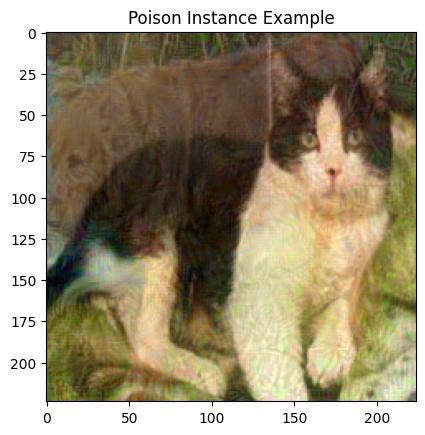

[Train #0] Loss: 0.2987 Acc: 87.8000% Time: 21.7732s
[Validation #0] Loss: 0.2311 Acc: 89.0000% Time: 25.6705s


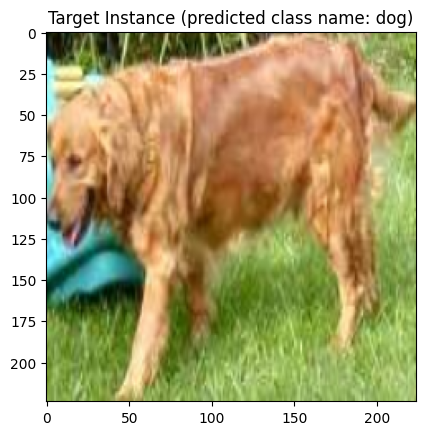

[Predicted Confidence] cat: 0.04001385718584061 | dog: 0.9599860906600952
poison attack success rate:0.04001385718584061
[Train #5] Loss: 0.0070 Acc: 99.9000% Time: 136.0814s
[Validation #5] Loss: 0.2726 Acc: 91.0000% Time: 140.3030s


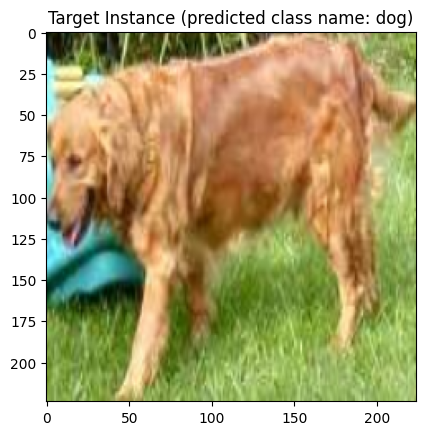

[Predicted Confidence] cat: 0.16474221646785736 | dog: 0.8352578282356262
poison attack success rate:0.16474221646785736
[Train #10] Loss: 0.0005 Acc: 100.0000% Time: 253.7512s
[Validation #10] Loss: 0.2575 Acc: 92.0000% Time: 257.8534s


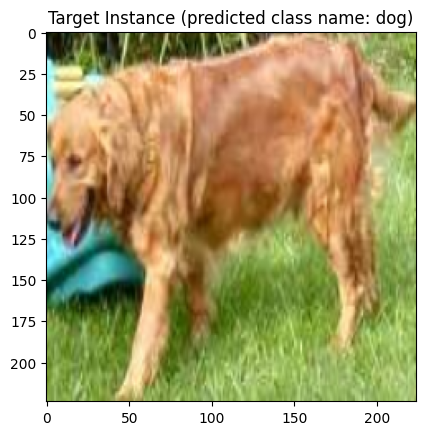

[Predicted Confidence] cat: 0.007215807680040598 | dog: 0.9927841424942017
poison attack success rate:0.007215807680040598
[Train #15] Loss: 0.0001 Acc: 100.0000% Time: 371.5523s
[Validation #15] Loss: 0.2841 Acc: 92.5000% Time: 375.8243s


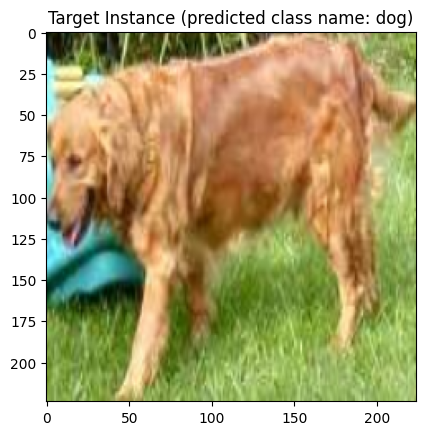

[Predicted Confidence] cat: 0.005698056425899267 | dog: 0.9943019151687622
poison attack success rate:0.005698056425899267
[Train #20] Loss: 0.0001 Acc: 100.0000% Time: 488.5282s
[Validation #20] Loss: 0.2977 Acc: 93.0000% Time: 491.7203s


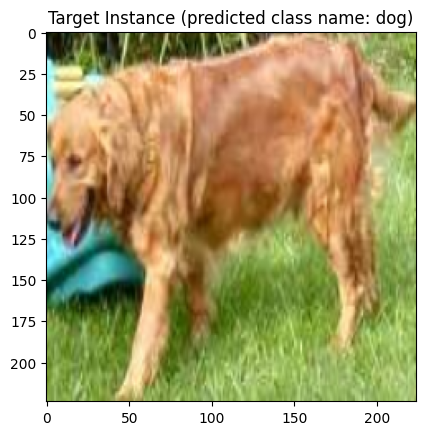

[Predicted Confidence] cat: 0.0030031991191208363 | dog: 0.9969967603683472
poison attack success rate:0.0030031991191208363
[Train #25] Loss: 0.0000 Acc: 100.0000% Time: 595.3166s
[Validation #25] Loss: 0.3096 Acc: 93.0000% Time: 598.5230s


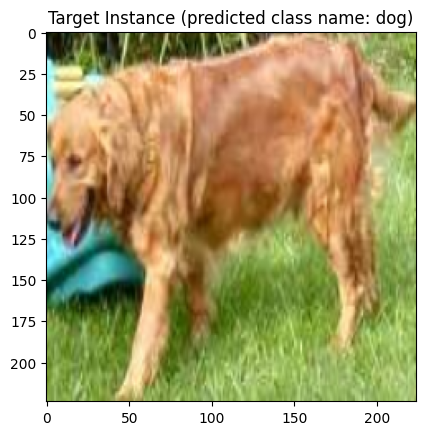

[Predicted Confidence] cat: 0.0016957425978034735 | dog: 0.9983042478561401
poison attack success rate:0.0016957425978034735
[Train #30] Loss: 0.0000 Acc: 100.0000% Time: 702.0283s
[Validation #30] Loss: 0.3212 Acc: 93.0000% Time: 705.2845s


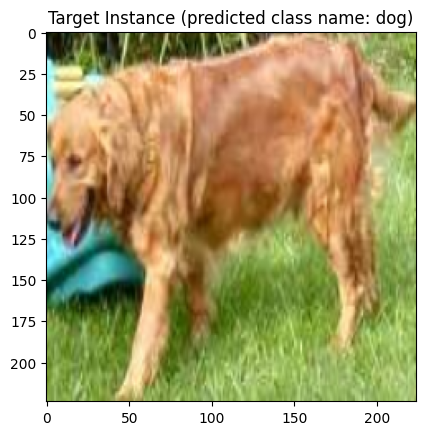

[Predicted Confidence] cat: 0.0011346283135935664 | dog: 0.9988653659820557
poison attack success rate:0.0011346283135935664


In [7]:
macc, pacc = train()
model_acces.append(macc)
poison_acces.append(pacc)

高不透明度水印测试

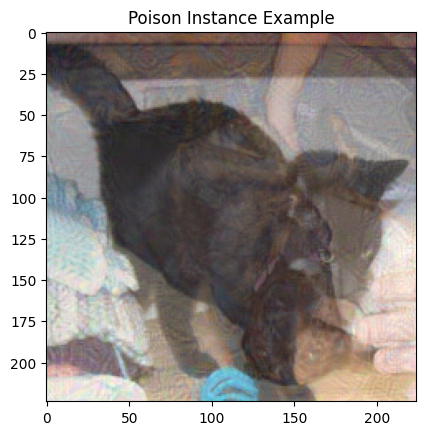

[Train #0] Loss: 0.2854 Acc: 87.2000% Time: 21.6851s
[Validation #0] Loss: 0.2360 Acc: 90.0000% Time: 25.0498s
poison attack success rate:2.0%


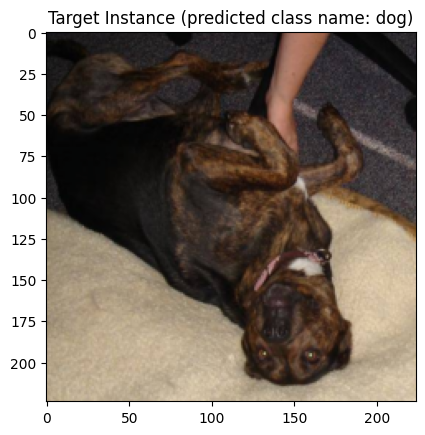

[Predicted Confidence] cat: 0.2369823306798935 | dog: 0.7630176544189453
poison attack success rate:0.2369823306798935
[Train #5] Loss: 0.0067 Acc: 99.8000% Time: 134.5582s
[Validation #5] Loss: 0.2425 Acc: 91.5000% Time: 138.0769s
poison attack success rate:9.0%


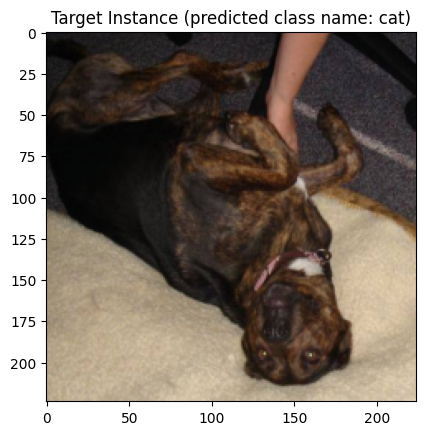

[Predicted Confidence] cat: 0.9700300097465515 | dog: 0.029969962313771248
poison attack success rate:0.9700300097465515
[Train #10] Loss: 0.0010 Acc: 100.0000% Time: 250.4299s
[Validation #10] Loss: 0.2645 Acc: 93.5000% Time: 254.0384s
poison attack success rate:4.0%


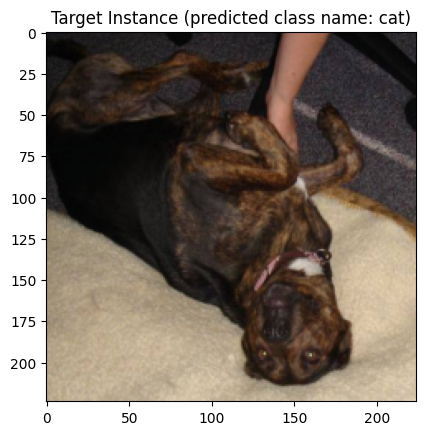

[Predicted Confidence] cat: 0.9508302807807922 | dog: 0.04916969686746597
poison attack success rate:0.9508302807807922
[Train #15] Loss: 0.0001 Acc: 100.0000% Time: 367.3814s
[Validation #15] Loss: 0.3125 Acc: 93.5000% Time: 370.8193s
poison attack success rate:4.0%


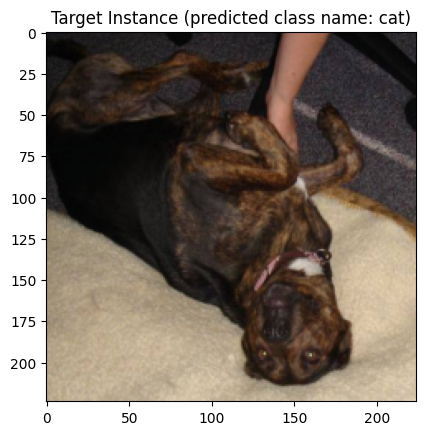

[Predicted Confidence] cat: 0.9588239789009094 | dog: 0.041175998747348785
poison attack success rate:0.9588239789009094
[Train #20] Loss: 0.0001 Acc: 100.0000% Time: 482.7572s
[Validation #20] Loss: 0.3409 Acc: 93.0000% Time: 486.1523s
poison attack success rate:5.0%


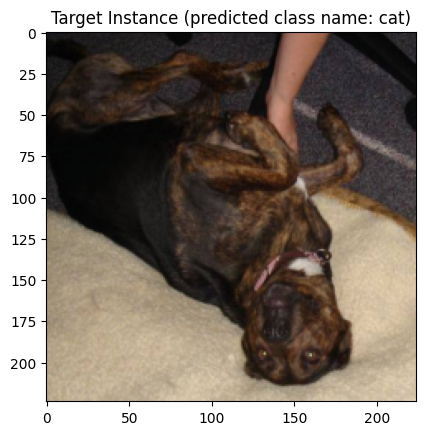

[Predicted Confidence] cat: 0.9680957794189453 | dog: 0.031904276460409164
poison attack success rate:0.9680957794189453
[Train #25] Loss: 0.0000 Acc: 100.0000% Time: 594.3605s
[Validation #25] Loss: 0.3545 Acc: 93.0000% Time: 598.3451s
poison attack success rate:5.0%


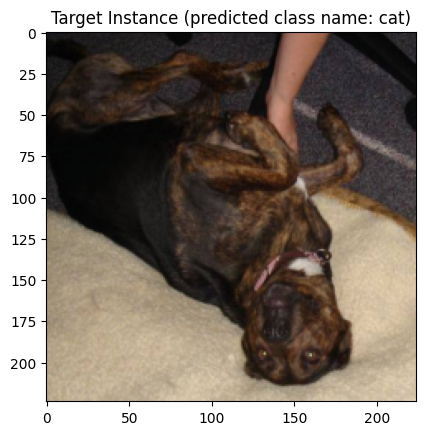

[Predicted Confidence] cat: 0.971878170967102 | dog: 0.028121836483478546
poison attack success rate:0.971878170967102
[Train #30] Loss: 0.0000 Acc: 100.0000% Time: 708.5313s
[Validation #30] Loss: 0.3683 Acc: 93.0000% Time: 712.0970s
poison attack success rate:4.0%


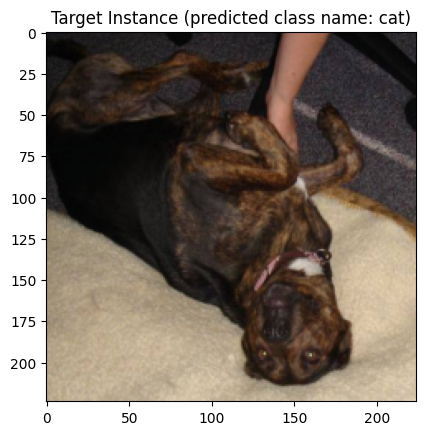

[Predicted Confidence] cat: 0.9704433083534241 | dog: 0.029556743800640106
poison attack success rate:0.9704433083534241


In [8]:
gama = 0.3
poi_rate = 0.001
model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc
macc, pacc = train()
model_acces.append(macc)
poison_acces.append(pacc)

设置投毒率集合，循环测试

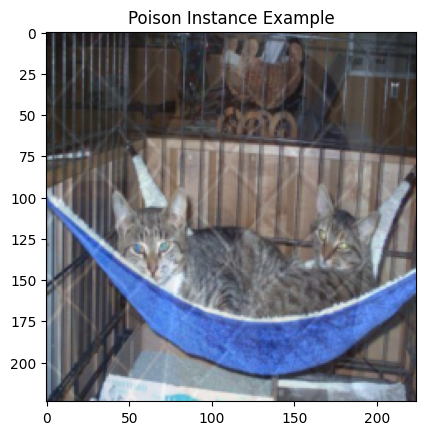

[Train #0] Loss: 0.3514 Acc: 83.4000% Time: 20.8543s
[Validation #0] Loss: 0.1947 Acc: 92.0000% Time: 24.2224s


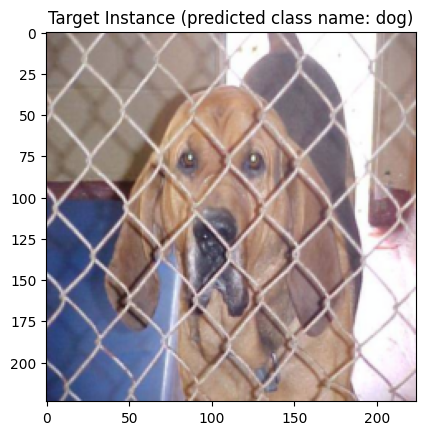

[Predicted Confidence] cat: 0.11451717466115952 | dog: 0.8854827880859375
poison attack success rate:0.11451717466115952
[Train #5] Loss: 0.0100 Acc: 99.8000% Time: 129.0001s
[Validation #5] Loss: 0.2433 Acc: 92.0000% Time: 132.3626s


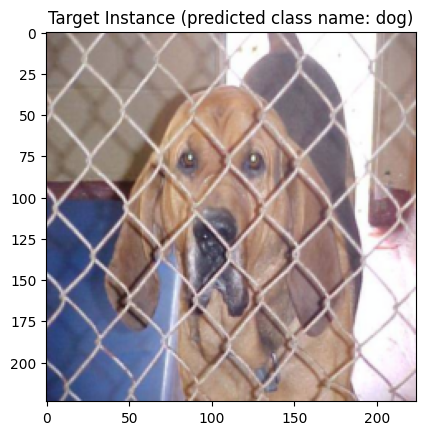

[Predicted Confidence] cat: 0.0001110785742639564 | dog: 0.9998888969421387
poison attack success rate:0.0001110785742639564
[Train #10] Loss: 0.0008 Acc: 100.0000% Time: 240.4724s
[Validation #10] Loss: 0.3057 Acc: 91.5000% Time: 243.7146s


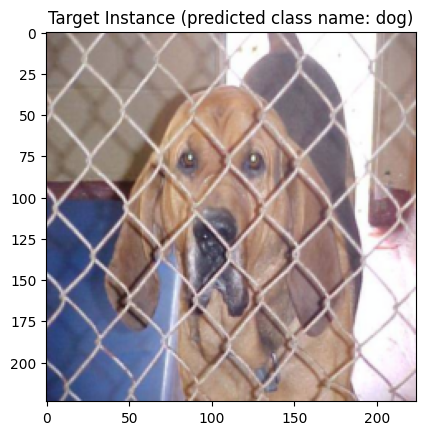

[Predicted Confidence] cat: 4.675337913795374e-05 | dog: 0.9999532699584961
poison attack success rate:4.675337913795374e-05
[Train #15] Loss: 0.0024 Acc: 100.0000% Time: 351.7871s
[Validation #15] Loss: 0.2527 Acc: 93.5000% Time: 355.2469s


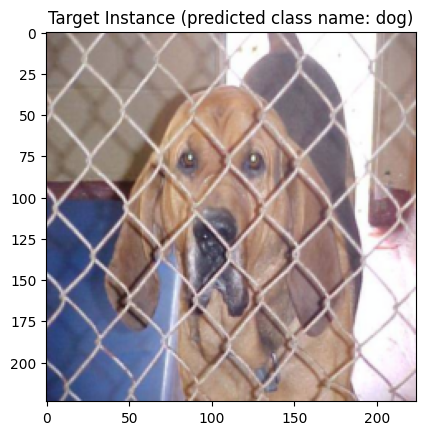

[Predicted Confidence] cat: 1.246732244908344e-05 | dog: 0.9999874830245972
poison attack success rate:1.246732244908344e-05
[Train #20] Loss: 0.0001 Acc: 100.0000% Time: 465.4709s
[Validation #20] Loss: 0.2767 Acc: 93.5000% Time: 468.9397s


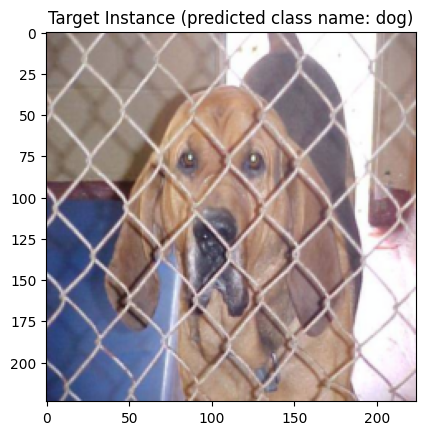

[Predicted Confidence] cat: 1.6106640998714283e-07 | dog: 0.9999998807907104
poison attack success rate:1.6106640998714283e-07
[Train #25] Loss: 0.0000 Acc: 100.0000% Time: 574.7392s
[Validation #25] Loss: 0.3003 Acc: 94.5000% Time: 578.1886s


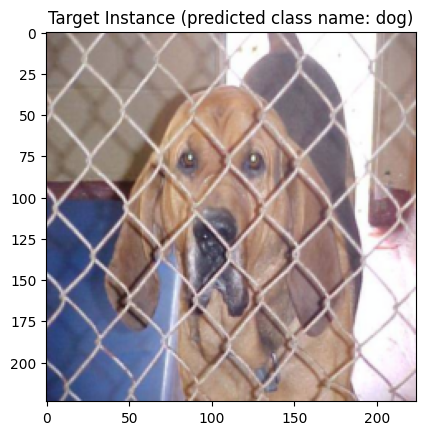

[Predicted Confidence] cat: 5.53453638474366e-08 | dog: 1.0
poison attack success rate:5.53453638474366e-08
[Train #30] Loss: 0.0000 Acc: 100.0000% Time: 684.3395s
[Validation #30] Loss: 0.3152 Acc: 94.5000% Time: 687.7705s


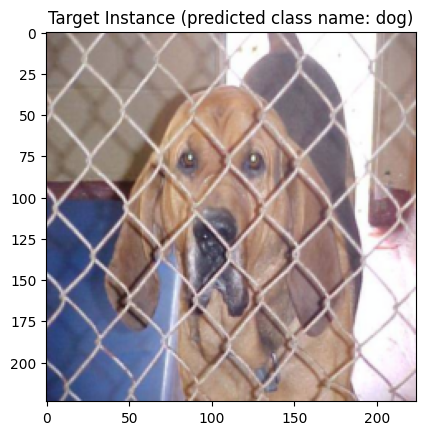

[Predicted Confidence] cat: 2.5068453979315564e-08 | dog: 1.0
poison attack success rate:2.5068453979315564e-08


In [22]:
gama = 0.2
poi_rates = [0.01,0.03,0.05]
poi_rate = poi_rates[0]
model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc
macc, pacc = train()
model_acces.append(macc)
poison_acces.append(pacc)

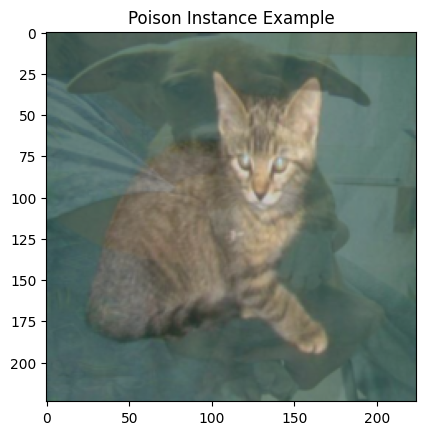

[Train #0] Loss: 0.4815 Acc: 78.1000% Time: 21.2837s
[Validation #0] Loss: 0.2235 Acc: 91.0000% Time: 24.6322s


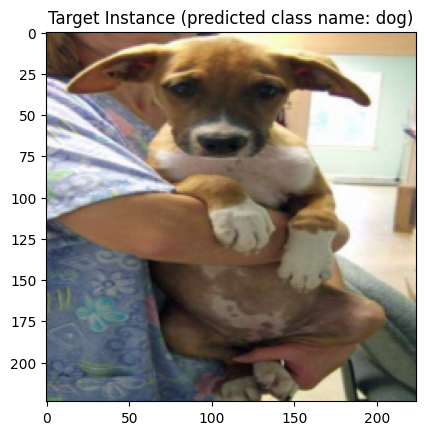

[Predicted Confidence] cat: 0.02160472609102726 | dog: 0.9783952236175537
poison attack success rate:0.02160472609102726
[Train #5] Loss: 0.0205 Acc: 99.5000% Time: 128.3117s
[Validation #5] Loss: 0.4454 Acc: 86.5000% Time: 131.6220s


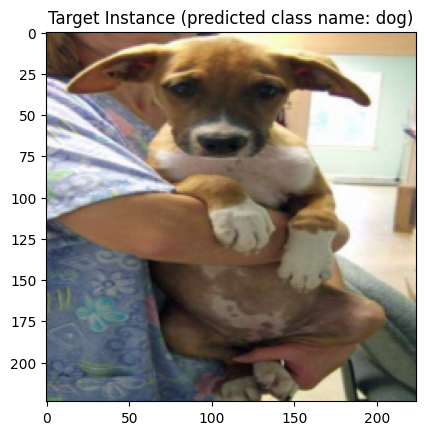

[Predicted Confidence] cat: 3.050404373539095e-08 | dog: 1.0
poison attack success rate:3.050404373539095e-08
[Train #10] Loss: 0.0034 Acc: 100.0000% Time: 235.7561s
[Validation #10] Loss: 0.2375 Acc: 93.0000% Time: 239.1198s


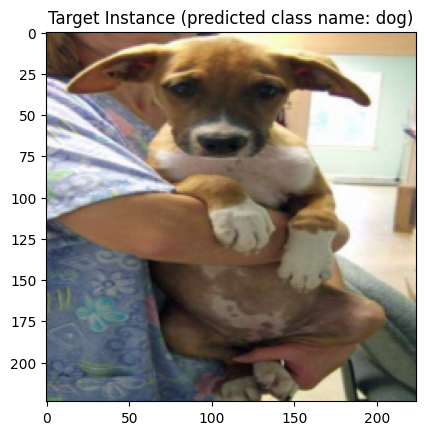

[Predicted Confidence] cat: 4.40968619841442e-07 | dog: 0.9999995231628418
poison attack success rate:4.40968619841442e-07
[Train #15] Loss: 0.0002 Acc: 100.0000% Time: 343.6095s
[Validation #15] Loss: 0.2810 Acc: 92.5000% Time: 346.9667s


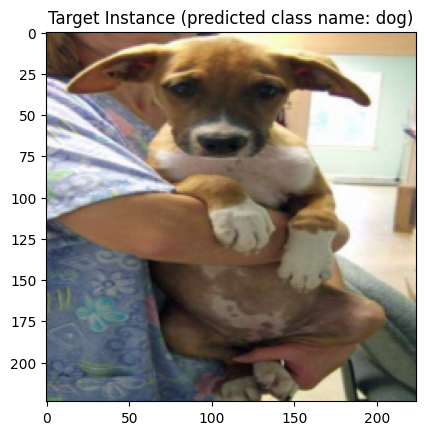

[Predicted Confidence] cat: 5.134646130500187e-07 | dog: 0.9999995231628418
poison attack success rate:5.134646130500187e-07
[Train #20] Loss: 0.0001 Acc: 100.0000% Time: 450.9955s
[Validation #20] Loss: 0.3059 Acc: 93.0000% Time: 454.3807s


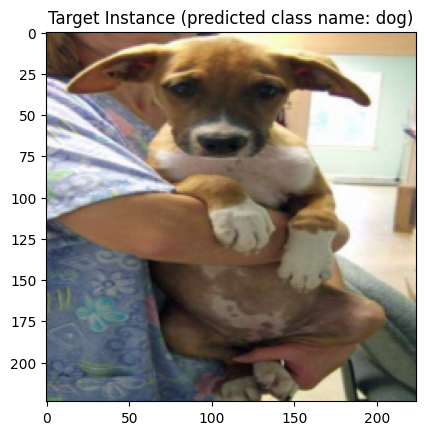

[Predicted Confidence] cat: 1.4627340760853258e-07 | dog: 0.9999998807907104
poison attack success rate:1.4627340760853258e-07
[Train #25] Loss: 0.0000 Acc: 100.0000% Time: 558.5633s
[Validation #25] Loss: 0.3299 Acc: 93.0000% Time: 561.8970s


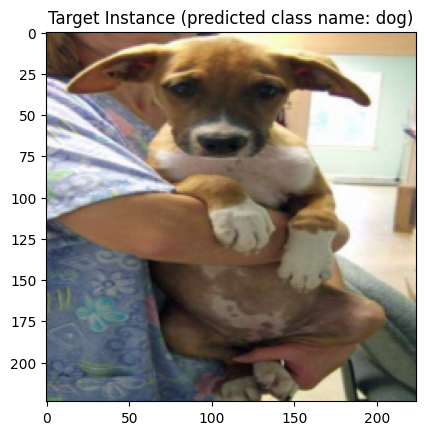

[Predicted Confidence] cat: 9.108248377742711e-08 | dog: 0.9999998807907104
poison attack success rate:9.108248377742711e-08
[Train #30] Loss: 0.0000 Acc: 100.0000% Time: 667.0097s
[Validation #30] Loss: 0.3431 Acc: 93.5000% Time: 670.3871s


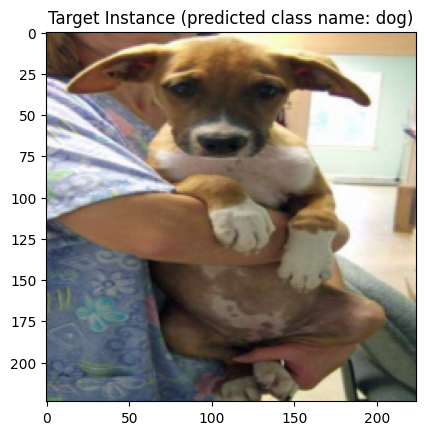

[Predicted Confidence] cat: 4.1764206315519914e-08 | dog: 1.0
poison attack success rate:4.1764206315519914e-08


In [23]:
poi_rates = [0.01,0.03,0.05]
poi_rate = poi_rates[1]
model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc
macc, pacc = train()
model_acces.append(macc)
poison_acces.append(pacc)

In [ ]:
poi_rate = poi_rates[2]
model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc
macc, pacc = train()
model_acces.append(macc)
poison_acces.append(pacc)

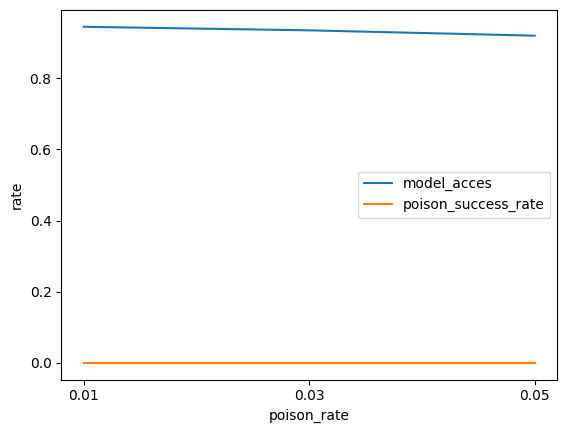

In [7]:
# 绘制变化图
plt.plot(model_acces)
plt.plot(poison_acces)
plt.legend(["model_acces", "poison_success_rate"])
plt.xlabel('poison_rate')
plt.ylabel('rate')
_x =[0,1,2]

plt.xticks(_x,poi_rates)        #分别代表刻度范围和刻度内容
plt.show()

基样本与目标样本一对一生成多张毒样本投毒

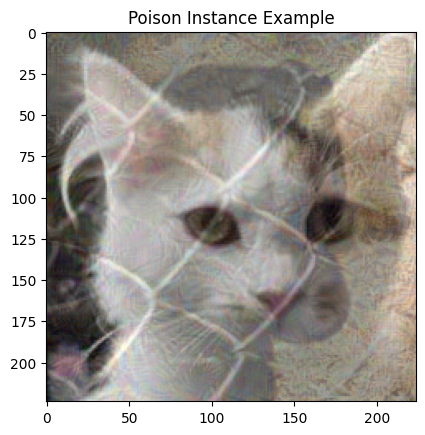

[Train #0] Loss: 0.3096 Acc: 85.3000% Time: 21.0698s
[Validation #0] Loss: 0.2482 Acc: 89.5000% Time: 24.4829s
poison attack success rate:2.0%


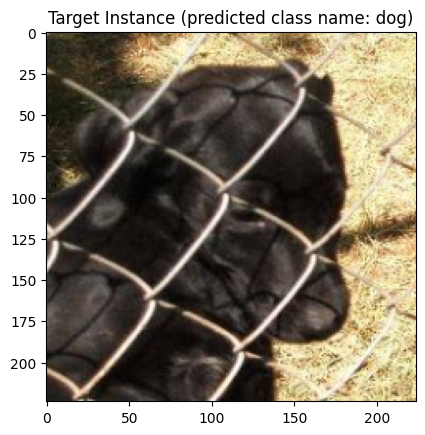

[Predicted Confidence] cat: 0.01630009151995182 | dog: 0.9836998581886292
poison attack success rate:0.01630009151995182
[Train #5] Loss: 0.0069 Acc: 99.9000% Time: 135.5695s
[Validation #5] Loss: 0.2285 Acc: 92.0000% Time: 138.9762s
poison attack success rate:6.0%


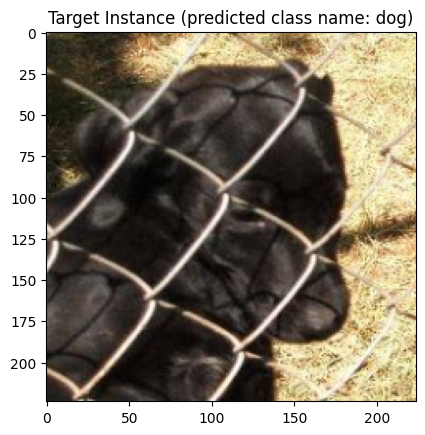

[Predicted Confidence] cat: 0.0014169964706525207 | dog: 0.9985830783843994
poison attack success rate:0.0014169964706525207
[Train #10] Loss: 0.0274 Acc: 99.1000% Time: 247.7462s
[Validation #10] Loss: 0.2712 Acc: 90.5000% Time: 251.1313s
poison attack success rate:5.0%


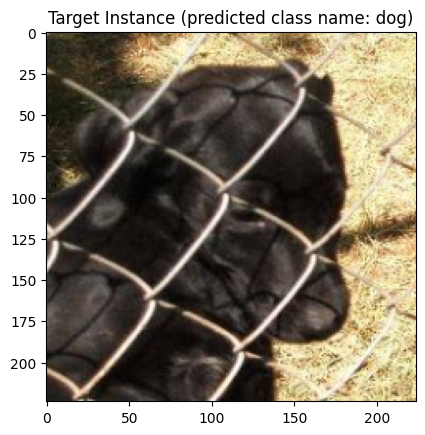

[Predicted Confidence] cat: 0.0015816574450582266 | dog: 0.9984183311462402
poison attack success rate:0.0015816574450582266
[Train #15] Loss: 0.0147 Acc: 99.5000% Time: 358.8989s
[Validation #15] Loss: 0.2490 Acc: 92.0000% Time: 362.2825s
poison attack success rate:4.0%


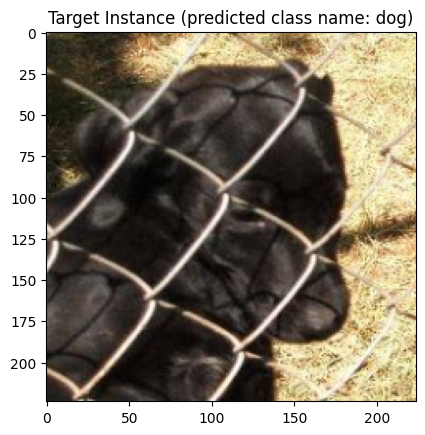

[Predicted Confidence] cat: 0.02984693832695484 | dog: 0.9701530933380127
poison attack success rate:0.02984693832695484
[Train #20] Loss: 0.0024 Acc: 99.9000% Time: 471.4549s
[Validation #20] Loss: 0.4552 Acc: 89.0000% Time: 474.8788s
poison attack success rate:9.0%


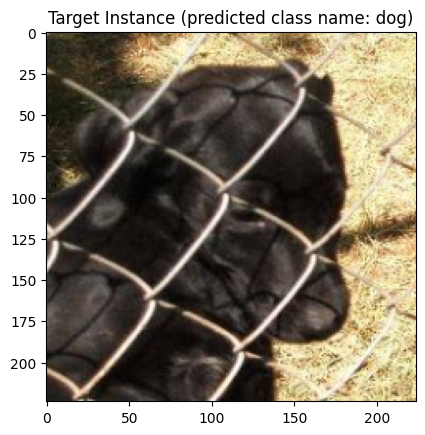

[Predicted Confidence] cat: 0.0029253391548991203 | dog: 0.9970746040344238
poison attack success rate:0.0029253391548991203
[Train #25] Loss: 0.0004 Acc: 100.0000% Time: 584.5340s
[Validation #25] Loss: 0.2890 Acc: 94.5000% Time: 587.9834s
poison attack success rate:4.0%


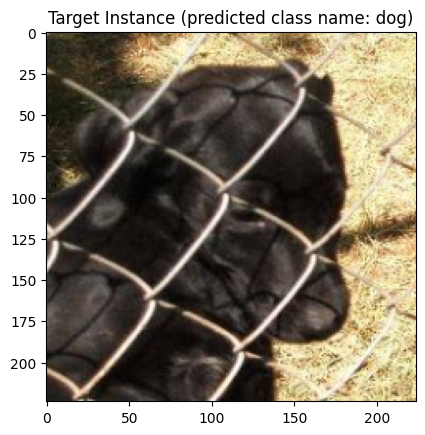

[Predicted Confidence] cat: 0.08984649181365967 | dog: 0.9101535081863403
poison attack success rate:0.08984649181365967
[Train #30] Loss: 0.0000 Acc: 100.0000% Time: 697.7703s
[Validation #30] Loss: 0.3044 Acc: 94.5000% Time: 701.1906s
poison attack success rate:4.0%


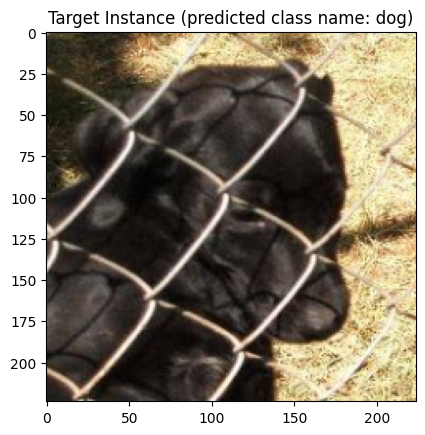

[Predicted Confidence] cat: 0.026606576517224312 | dog: 0.9733933806419373
poison attack success rate:0.026606576517224312


(tensor(94.5000), tensor(4.))

In [3]:
gama = 0.2
poi_rate = 0.001
model_acces = []
poison_acces = []

class StudentNetwork(nn.Module):
    def __init__(self):
        super(StudentNetwork, self).__init__()

        # load a pre-trained model for the feature extractor
        self.feature_extractor = nn.Sequential(*list(models.alexnet(weights=models.AlexNet_Weights.DEFAULT).children())[:-1]).eval()
        self.fc = nn.Linear(9216, 2) # binary classification (num_of_class == 2)

        # fix the pre-trained network
        # for param in self.feature_extractor.parameters():
        #     param.requires_grad = False

    def forward(self, images):
        features = self.feature_extractor(images)
        x = torch.flatten(features, 1)
        outputs = self.fc(x)
        return features, outputs

def GenPoiImg(base_instance,target_instance):
    base_instance = gama*target_instance + (1 - gama)*base_instance
    mean_tensor = torch.from_numpy(np.array([0.485, 0.456, 0.406]))
    std_tensor = torch.from_numpy(np.array([0.229, 0.224, 0.225]))

    unnormalized_base_instance = base_instance.clone()
    unnormalized_base_instance[:, 0, :, :] *= std_tensor[0]
    unnormalized_base_instance[:, 0, :, :] += mean_tensor[0]
    unnormalized_base_instance[:, 1, :, :] *= std_tensor[1]
    unnormalized_base_instance[:, 1, :, :] += mean_tensor[1]
    unnormalized_base_instance[:, 2, :, :] *= std_tensor[2]
    unnormalized_base_instance[:, 2, :, :] += mean_tensor[2]

    perturbed_instance = unnormalized_base_instance.clone()
    target_features, outputs = model(target_instance)

    transforms_normalization = transforms.Compose([
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

    epsilon = 16 / 255
    alpha = 0.05 / 255

    start_time = time.time()
    # 尝试改一下这里的迭代次数
    for i in range(500):
        perturbed_instance.requires_grad = True

        poison_instance = transforms_normalization(perturbed_instance)
        poison_features, _ = model(poison_instance)
        # 补充代码

        feature_loss = nn.MSELoss()(poison_features, target_features)
        image_loss = nn.MSELoss()(poison_instance, base_instance)
        # feature_loss = torch.dist(target_features, poison_features, p=2) ** 2
        # image_loss = torch.dist(base_instance, poison_instance, p=2) ** 2
        loss = feature_loss + image_loss / 1e2
        loss.backward(retain_graph=True)

        signed_gradient = perturbed_instance.grad.sign()

        perturbed_instance = perturbed_instance - alpha * signed_gradient

        eta = torch.clamp(perturbed_instance - unnormalized_base_instance, -epsilon, epsilon)
        perturbed_instance = torch.clamp(unnormalized_base_instance + eta, 0, 1).detach()

        # if i == 0 or (i + 1) % 500 == 0:
        #     print(f'Feature loss: {feature_loss}, Image loss: {image_loss}, Time: {time.time() - start_time}')

    poison_instance = transforms_normalization(perturbed_instance)
    # imshow(poison_instance[0].cpu(), 'Poison Instance')
    return poison_instance

model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc

def train():
    
    macc = 0
    pacc = 0
    base_instance_sum = []
    target_instance_sum = []
    for inputs, labels in test_dataloader:
        for i in range(inputs.shape[0]):
            if labels[i].item() == 0:  # if it's a cat
                base_instance_sum.append(inputs[i].unsqueeze(0).to(device))
            elif labels[i].item() == 1:  # if it's a dog
                target_instance_sum.append(inputs[i].unsqueeze(0).to(device))
    temp = len(base_instance_sum)
    poi_num = int(poi_rate * 1000)
    poison_instance_sum = []
    for n in range(poi_num):
        poison_instance_sum.append(GenPoiImg(base_instance_sum[n], target_instance_sum[n]))
    imshow(poison_instance_sum[0][0], 'Poison Instance Example')

    num_epochs = 31
    start_time = time.time()

    for epoch in range(num_epochs):
        i_poi = int(poi_num / 16)
        b_poi = int(poi_num % 16)
        """ Training Phase """
        running_loss = 0.
        running_corrects = 0

        # load a batch data of images
        for i, (inputs, labels) in enumerate(train_dataloader):
            tempnum = 16
            if i == i_poi:
                tempnum = b_poi

            # for the first batch
            if i <= i_poi:
                for j in range(tempnum):
                    # change the first data to poison image
                    inputs[j] = poison_instance_sum[i*16+j]
                    labels[j] = torch.tensor(0)

            inputs = inputs.to(device)
            labels = labels.to(device)

            # forward inputs and get output
            optimizer.zero_grad()

            features, outputs = model(inputs)

            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # get loss value and update the network weights
            loss.backward(retain_graph=True)
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_datasets)
        epoch_acc = running_corrects / len(train_datasets) * 100.

        if (epoch == 0) or epoch % 5 == 0:
            print('[Train #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc,
                                                                               time.time() - start_time))

            """ Validation Phase """
            with torch.no_grad():
                running_loss = 0.
                running_corrects = 0

                for inputs, labels in val_dataloader:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    features, outputs = model(inputs)

                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                epoch_loss = running_loss / len(val_datasets)
                epoch_acc = running_corrects / len(val_datasets) * 100.
                macc = epoch_acc
                print('[Validation #{}] Loss: {:.4f} Acc: {:.4f}% Time: {:.4f}s'.format(epoch, epoch_loss, epoch_acc,
                                                                                        time.time() - start_time))
                """ Poisoning Attack Test Phase """
                # with torch.no_grad():
                running_corrects = 0
                for inputs in target_instance_sum:
                    inputs = inputs.to(device)

                    features, outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)

                    running_corrects += torch.sum(preds == 0)
                epoch_acc = running_corrects / len(target_instance_sum) * 100.
                pacc = epoch_acc
                print(f'poison attack success rate:{epoch_acc}%')
                
                _, outputs = model(target_instance_sum[0])
                _, preds = torch.max(outputs, 1)
                imshow(target_instance_sum[0][0].cpu(), f'Target Instance (predicted class name: {class_names[preds.item()]})')
                percentages = nn.Softmax(dim=1)(outputs)[0]
                print(f'[Predicted Confidence] {class_names[0]}: {percentages[0]} | {class_names[1]}: {percentages[1]}')
                print(f'poison attack success rate:{percentages[0]}')
    return macc, pacc

train()

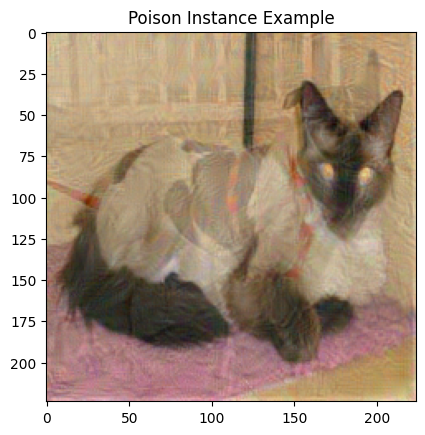

[Train #0] Loss: 0.3164 Acc: 85.6000% Time: 22.7598s
[Validation #0] Loss: 0.2172 Acc: 90.5000% Time: 26.2847s
poison attack success rate:9.0%


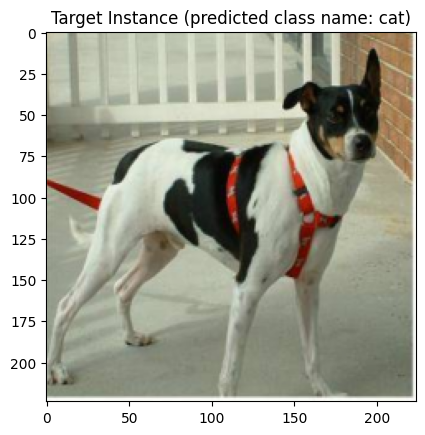

[Predicted Confidence] cat: 0.6917220950126648 | dog: 0.3082779347896576
poison attack success rate:0.6917220950126648
[Train #5] Loss: 0.0091 Acc: 99.9000% Time: 136.4478s
[Validation #5] Loss: 0.2471 Acc: 90.0000% Time: 139.9141s
poison attack success rate:9.0%


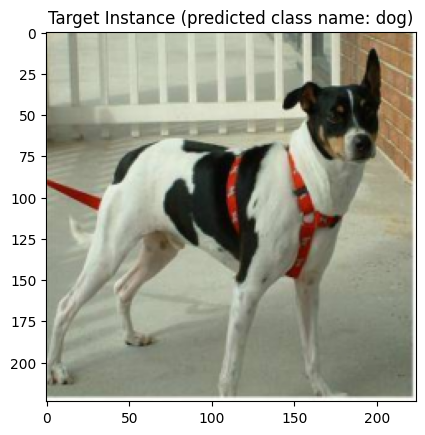

[Predicted Confidence] cat: 0.4164563715457916 | dog: 0.5835435390472412
poison attack success rate:0.4164563715457916
[Train #10] Loss: 0.0011 Acc: 100.0000% Time: 252.4950s
[Validation #10] Loss: 0.2695 Acc: 91.0000% Time: 255.9206s
poison attack success rate:7.0%


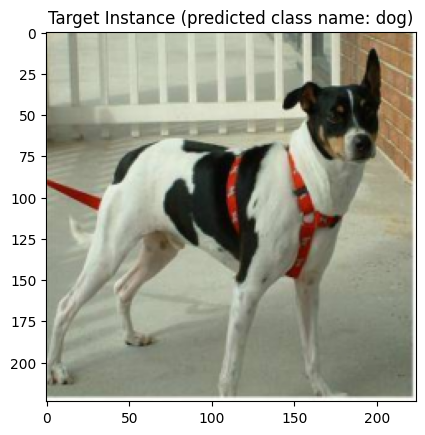

[Predicted Confidence] cat: 0.048314109444618225 | dog: 0.951685905456543
poison attack success rate:0.048314109444618225
[Train #15] Loss: 0.0002 Acc: 100.0000% Time: 368.1870s
[Validation #15] Loss: 0.3051 Acc: 91.0000% Time: 371.7184s
poison attack success rate:8.0%


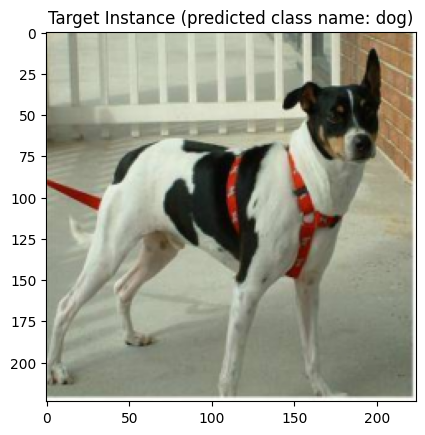

[Predicted Confidence] cat: 0.005054919049143791 | dog: 0.9949451088905334
poison attack success rate:0.005054919049143791
[Train #20] Loss: 0.0001 Acc: 100.0000% Time: 485.9850s
[Validation #20] Loss: 0.3275 Acc: 90.5000% Time: 489.4951s
poison attack success rate:8.0%


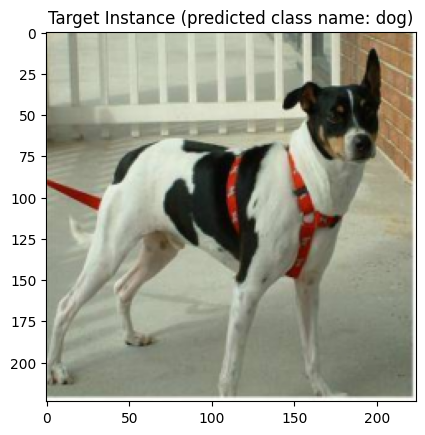

[Predicted Confidence] cat: 0.0024366641882807016 | dog: 0.997563362121582
poison attack success rate:0.0024366641882807016
[Train #25] Loss: 0.0001 Acc: 100.0000% Time: 602.1324s
[Validation #25] Loss: 0.3472 Acc: 90.5000% Time: 606.1124s
poison attack success rate:8.0%


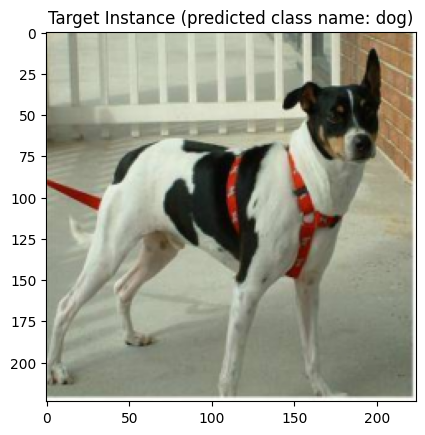

[Predicted Confidence] cat: 0.0018444756278768182 | dog: 0.9981555342674255
poison attack success rate:0.0018444756278768182
[Train #30] Loss: 0.0000 Acc: 100.0000% Time: 718.1811s
[Validation #30] Loss: 0.3634 Acc: 90.5000% Time: 721.5384s
poison attack success rate:9.0%


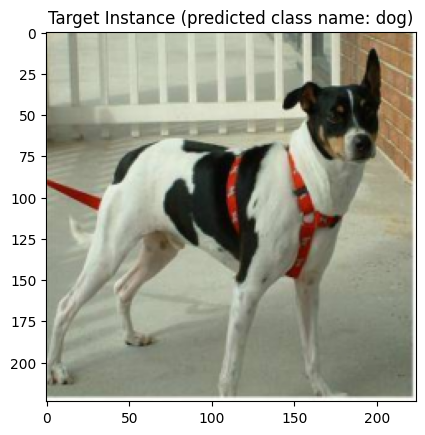

[Predicted Confidence] cat: 0.0010447570821270347 | dog: 0.998955249786377
poison attack success rate:0.0010447570821270347


In [4]:
poi_rates = [0.01,0.03,0.05]
poi_rate = poi_rates[0]

model = StudentNetwork().to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)#.fc

macc, pacc = train()
model_acces.append(macc)
poison_acces.append(pacc)